In [2]:
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Utility functions

In [3]:
plt.rcParams['text.usetex'] = False  # Enable full LaTeX rendering
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

def create_latex_image(latex_str: str, figsize: tuple = (2, 1), fontsize: int = 42) -> None:
    """
    Displays an image with a LaTeX formula.
    
    Args:
        latex_str: The LaTeX string to be displayed
        figsize: Figure size in inches (width, height)
        fontsize: Font size for the LaTeX text
    """
    plt.figure(figsize=figsize, dpi=200)
    plt.text(0, 0, latex_str, fontsize=fontsize, ha='center', va='center')
    plt.axis('off')
    plt.show()

def numpy_to_latex(matrix: np.ndarray) -> str:
    """
    Converts a NumPy array to a LaTeX string representation.
    
    Args:
        matrix: The NumPy array to be converted
        
    Returns:
        The LaTeX string representation of the matrix
    """
    rows = [' & '.join(map(str, row)) for row in matrix]
    latex_str = r'\begin{pmatrix} ' + r' \\ '.join(rows) + r' \end{pmatrix}'
    return latex_str

def plot_images(images: list, titles: list = None, figsize: tuple = (15, 10), cmap: str = None) -> None:
    """
    Plot multiple images in a single figure.
    
    Args:
        images: List of images to display
        titles: List of titles for each image (optional)
        figsize: Figure size in inches (width, height)
        cmap: Colormap to use for displaying images
    """
    n_images = len(images)
    if titles is None:
        titles = [f'Image {i+1}' for i in range(n_images)]
    
    fig, axes = plt.subplots(1, n_images, figsize=figsize)
    if n_images == 1:
        axes = [axes]
    
    for i, (ax, img, title) in enumerate(zip(axes, images, titles)):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Camera calibration

Source: https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html


In [4]:
def calibrate_camera(image_paths, chessboard_size=(7, 6), verbose=True):
    """
    Calibrate camera using chessboard images.
    
    Args:
        image_paths: List of Path objects pointing to calibration images
        chessboard_size: Size of the chessboard pattern as (width, height)
        verbose: Whether to print calibration results
        
    Returns:
        dict: Dictionary containing calibration results with keys:
            - 'success': Boolean indicating if calibration was successful
            - 'camera_matrix': Camera intrinsic matrix
            - 'dist_coeffs': Distortion coefficients
            - 'rvecs': Rotation vectors for each calibration image
            - 'tvecs': Translation vectors for each calibration image
            - 'error': RMS reprojection error
            - 'objpoints': 3D points in world space
            - 'imgpoints': 2D points in image plane
            - 'successful_images': Number of successfully processed images
    """
    # Setup criteria for cornerSubPix
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    # Prepare object points (0,0,0), (1,0,0), (2,0,0) ..., (6,5,0)
    objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
    objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
    
    # Arrays to store object points and image points
    objpoints = []  # 3D points in real world space
    imgpoints = []  # 2D points in image plane
    
    successful_images = 0
    for image_path in image_paths:
        img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
        if img is None:
            if verbose:
                print(f"Could not read image {image_path}")
            continue
        
        ret, corners = cv2.findChessboardCorners(img, chessboard_size, None)
        
        if ret:
            successful_images += 1
            objpoints.append(objp)
            refined_corners = cv2.cornerSubPix(img, corners, (11, 11), (-1, -1), criteria)
            imgpoints.append(refined_corners)
            
            # Optional: Draw and display the corners if needed
            # img_with_corners = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
            # cv2.drawChessboardCorners(img_with_corners, chessboard_size, refined_corners, ret)
    
    # Prepare result dictionary with default values
    result = {
        'success': False,
        'camera_matrix': None,
        'dist_coeffs': None,
        'rvecs': None,
        'tvecs': None,
        'error': None,
        'objpoints': objpoints,
        'imgpoints': imgpoints,
        'successful_images': successful_images
    }
    
    if successful_images > 0:
        # Perform camera calibration
        ret, camera_matrix, dist_coeffs, rvecs, tvecs = cv2.calibrateCamera(
            objpoints, imgpoints, img.shape[::-1], None, None
        )
        
        # Update result dictionary
        result.update({
            'success': True,
            'camera_matrix': camera_matrix,
            'dist_coeffs': dist_coeffs,
            'rvecs': rvecs,
            'tvecs': tvecs,
            'error': ret
        })
    
    return result

### Left camera

In [5]:
CHESSBOARD_SIZE = (7, 6)  # width (columns), height (rows)

left_image_paths = list(Path("./data/calib").glob("left*.jpg"))
left_calibration_result = calibrate_camera(left_image_paths, CHESSBOARD_SIZE)
if left_calibration_result['success']:
    print("Camera Matrix:")
    print(left_calibration_result['camera_matrix'])
    print("Distortion Coefficients:")
    print(left_calibration_result['dist_coeffs'])
    print("RMS Reprojection Error:")
    print(left_calibration_result['error'])
else:
    print("Camera calibration failed.")

Camera Matrix:
[[534.15663136   0.         341.71479628]
 [  0.         534.25492559 232.05013999]
 [  0.           0.           1.        ]]
Distortion Coefficients:
[[-2.94269293e-01  1.23247845e-01  1.13850492e-03 -1.38021876e-04
   1.02084844e-02]]
RMS Reprojection Error:
0.15589875911312753


### Right camera

In [6]:
CHESSBOARD_SIZE = (7, 6)  # width (columns), height (rows)

right_image_paths = list(Path("./data/calib").glob("right*.jpg"))
right_calibration_result = calibrate_camera(right_image_paths, CHESSBOARD_SIZE)
if right_calibration_result['success']:
    print("Camera Matrix:")
    print(right_calibration_result['camera_matrix'])
    print("Distortion Coefficients:")
    print(right_calibration_result['dist_coeffs'])
    print("RMS Reprojection Error:")
    print(right_calibration_result['error'])
else:
    print("Camera calibration failed.")

Camera Matrix:
[[538.76176998   0.         325.83574557]
 [  0.         538.58977298 247.78369721]
 [  0.           0.           1.        ]]
Distortion Coefficients:
[[-0.30360309  0.17022813 -0.00032864  0.0013441  -0.05634536]]
RMS Reprojection Error:
0.14974400919614095


# Epipolar Geometry

In [7]:
def find_keypoints_and_matches(img_left: np.ndarray, img_right: np.ndarray) -> tuple:
    """
    Find keypoints and matches between two images using SIFT and FLANN.
    
    Args:
        img_left: Left image as numpy array
        img_right: Right image as numpy array
        
    Returns:
        tuple: A tuple containing:
            - pts1: List of matching points in the left image
            - pts2: List of matching points in the right image
            - kp1: Keypoints in the left image
            - kp2: Keypoints in the right image
            - matches: FLANN matches between the two images
    """
    sift = cv2.SIFT_create()
    
    kp1, des1 = sift.detectAndCompute(img_left, None)
    kp2, des2 = sift.detectAndCompute(img_right, None)
    
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1, des2, k=2)
    
    pts1 = []
    pts2 = []
    
    for i, (m, n) in enumerate(matches):
        if m.distance < 0.8 * n.distance:
            pts2.append(kp2[m.trainIdx].pt)
            pts1.append(kp1[m.queryIdx].pt)
    
    return pts1, pts2, kp1, kp2, matches

def find_fundamental_matrix(pts1: list, pts2: list) -> tuple:
    """
    Calculate the fundamental matrix from corresponding points in two images.
    
    Args:
        pts1: List of points in the first image
        pts2: List of points in the second image
        
    Returns:
        tuple: A tuple containing:
            - F: Fundamental matrix
            - pts1: Filtered points in the first image (only inliers)
            - pts2: Filtered points in the second image (only inliers)
    """
    pts1 = np.int32(pts1)
    pts2 = np.int32(pts2)
    
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_LMEDS)
    
    pts1 = pts1[mask.ravel() == 1]
    pts2 = pts2[mask.ravel() == 1]
    
    return F, pts1, pts2

def find_essential_matrix(pts1: list, pts2: list, K1: np.ndarray) -> tuple:
    """
    Calculate the essential matrix from corresponding points in two images.
    
    Args:
        pts1: List of points in the first image
        pts2: List of points in the second image
        K1: Camera intrinsic matrix for the first image
        
    Returns:
        tuple: A tuple containing:
            - E: Essential matrix
            - pts1: Filtered points in the first image (only inliers)
            - pts2: Filtered points in the second image (only inliers)
    """
    pts1 = np.int32(pts1)
    pts2 = np.int32(pts2)
    
    E, mask = cv2.findEssentialMat(pts1, pts2, K1, method=cv2.RANSAC, prob=0.999, threshold=1.0)
    
    pts1 = pts1[mask.ravel() == 1]
    pts2 = pts2[mask.ravel() == 1]
    
    return E, pts1, pts2

def draw_epilines(img1: np.ndarray, img2: np.ndarray, lines: np.ndarray, pts1: np.ndarray, pts2: np.ndarray) -> tuple:
    """
    Draw epilines on images and mark the corresponding points.
    
    Args:
        img1: First image on which to draw the epilines for points in img2
        img2: Second image on which to draw the epilines for points in img1
        lines: Corresponding epilines
        pts1: Points in the first image
        pts2: Points in the second image
        
    Returns:
        tuple: A tuple containing:
            - img1_with_lines: First image with epilines and points drawn
            - img2_with_lines: Second image with corresponding points marked
    """
    r, c = img1.shape
    img1_with_lines = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2_with_lines = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    
    for r, pt1, pt2 in zip(lines, pts1, pts2):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        
        # Draw the line on img1 from (0,y0) to (c,y1)
        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])
        img1_with_lines = cv2.line(img1_with_lines, (x0, y0), (x1, y1), color, 1)
        
        # Draw points
        pt1_tuple = tuple(map(int, pt1))
        pt2_tuple = tuple(map(int, pt2))
        img1_with_lines = cv2.circle(img1_with_lines, pt1_tuple, 5, color, -1)
        img2_with_lines = cv2.circle(img2_with_lines, pt2_tuple, 5, color, -1)
    
    return img1_with_lines, img2_with_lines


In [8]:
img_left = cv2.imread("./data/calib/left14.jpg", cv2.IMREAD_GRAYSCALE)
img_right = cv2.imread("./data/calib/right14.jpg", cv2.IMREAD_GRAYSCALE)

Fundamental Matrix:
[[-1.41873377e-07  4.56429847e-07  6.91620825e-04]
 [ 4.43931545e-06  1.46198309e-06 -2.88025754e-02]
 [-2.04075877e-03  2.62386711e-02  1.00000000e+00]]


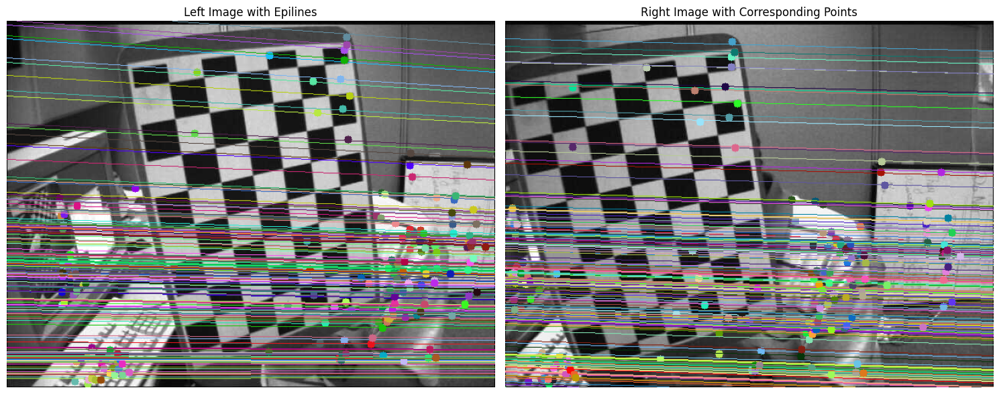

In [9]:
pts1, pts2, kp1, kp2, matches = find_keypoints_and_matches(img_left, img_right)

F, pts1, pts2 = find_fundamental_matrix(pts1, pts2)

print("Fundamental Matrix:")
print(F)

lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1, 1, 2), 2, F)
lines1 = lines1.reshape(-1, 3)

lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1, 1, 2), 1, F)
lines2 = lines2.reshape(-1, 3)

img1_with_lines, _ = draw_epilines(img_left, img_right, lines1, pts1, pts2)

img2_with_lines, _ = draw_epilines(img_right, img_left, lines2, pts2, pts1)

plot_images([img1_with_lines, img2_with_lines], titles=['Left Image with Epilines', 'Right Image with Corresponding Points'])


Essential Matrix:
[[ 0.00214356  0.02937931 -0.03331851]
 [ 0.01935956  0.01008028 -0.70596073]
 [ 0.02970241  0.70578485  0.01227601]]
Fundamental Matrix from Essential Matrix:
[[ 7.44851839e-09  1.02069579e-07 -8.80732752e-05]
 [ 6.72928111e-08  3.50320881e-08 -1.34188192e-03]
 [ 3.65051223e-05  1.27912551e-03  4.79154031e-02]]
Is F from E close to original F?
False
||F1 - F2|| = 0.003882749289159599


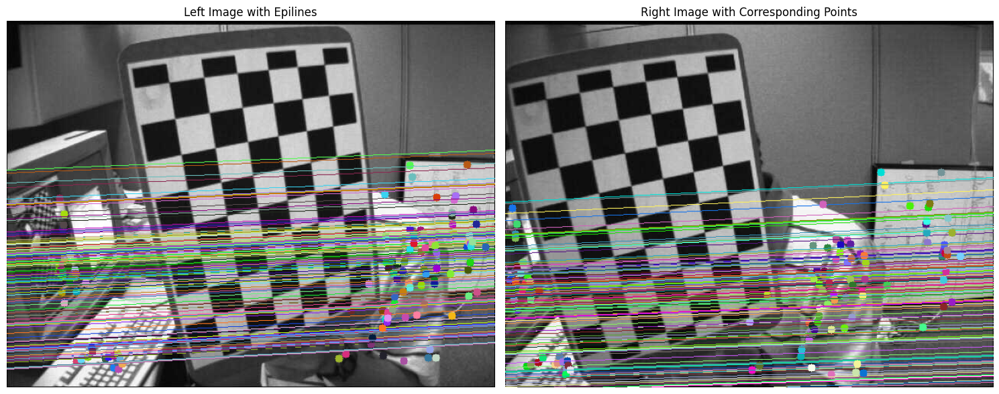

In [10]:
K_left = left_calibration_result['camera_matrix']
K_right = right_calibration_result['camera_matrix']

E, pts1, pts2 = find_essential_matrix(pts1, pts2, K_left)
print("Essential Matrix:")
print(E)

F_from_E = np.linalg.inv(K_right).T @ E @ np.linalg.inv(K_left)
print("Fundamental Matrix from Essential Matrix:")
print(F_from_E)

# Check if the fundamental matrix from essential matrix is close to the original fundamental matrix
print("Is F from E close to original F?")
F1 = F / np.linalg.norm(F)
F2 = F_from_E / np.linalg.norm(F_from_E)
print(np.allclose(F1, F2))
diff = np.linalg.norm(F1 - F2)
print("||F1 - F2|| =", diff)

lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1, 1, 2), 2, F_from_E)
lines1 = lines1.reshape(-1, 3)

lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1, 1, 2), 1, F_from_E)
lines2 = lines2.reshape(-1, 3)

img1_with_lines, _ = draw_epilines(img_left, img_right, lines1, pts1, pts2)
img2_with_lines, _ = draw_epilines(img_right, img_left, lines2, pts2, pts1)

plot_images([img1_with_lines, img2_with_lines], titles=['Left Image with Epilines', 'Right Image with Corresponding Points'])

What is considered a "good match"?
- A value of $∥F_1−F_2∥$ on the order of $10^{−2}$ or less is **excellent**
- On the order of $10^{−1}$ is **acceptable** for real data
- Greater than $0.2$–$0.3$ likely indicates an **error** somewhere: in calibration, normalization, or distortions

In [11]:
ret, R, t, mask = cv2.recoverPose(E, pts1, pts2, K_left)
print("Rotation Matrix:")
print(R)
print("Translation Vector:")
print(t)


Rotation Matrix:
[[ 0.99764996  0.0047284   0.06835354]
 [-0.00570646  0.99988401  0.01412067]
 [-0.06827885 -0.01447754  0.99756123]]
Translation Vector:
[[-0.99802018]
 [ 0.04781308]
 [ 0.04086115]]


## Как работает скошенная матрица $[t]_\times$

### Напоминание формулы:

$$E = [t]_\times \cdot R$$

где:
- $R$ — матрица поворота,
- $t$ — вектор переноса (translation),
- $[t]_\times$ — **антисимметричная (скошенная) матрица**, представляющая операцию **векторного произведения с вектором $t$**.

### Что такое $[t]_\times$?

$[t]_\times \cdot v = t \times v$

То есть: **эта матрица представляет векторное произведение вектора $t$ с любым другим вектором $v$**.

### Зачем это в $E = [t]_\times R$?  

Это позволяет выразить **эпиполярное ограничение в нормализованных координатах** следующим образом:

- Точка $x$ проецируется в пространстве.
- Поворачивается с помощью $R$,
- Затем вычисляется векторное произведение с $t$ — для построения эпиполярной плоскости.

То есть:

$$x_n'^T \cdot E \cdot x_n = x_n'^T \cdot [t]_\times \cdot R \cdot x_n = 0$$

Эта форма говорит: **точки $x_n$, $x_n'$ и вектор переноса $t$** — лежат в одной плоскости (эпиполярной), поэтому их смешанное произведение равно нулю.


#### Пример (Python + NumPy)

In [12]:
# Вектор переноса t
t_example = np.array([1, 2, 3])

# Вектор v, с которым будем вычислять векторное произведение
v = np.array([4, 5, 6])

# Скошенная (антисимметричная) матрица [t]_x
def skew_symmetric(t):
    return np.array([
        [0, -t[2], t[1]],
        [t[2], 0, -t[0]],
        [-t[1], t[0], 0]
    ])

t_skew = skew_symmetric(t_example)

# Векторное произведение напрямую (через np.cross)
cross_direct = np.cross(t_example, v)

# Векторное произведение через умножение матрицы [t]_x на v
cross_matrix = t_skew @ v

print("np.cross(t, v) =", cross_direct)
print("[t]_x @ v      =", cross_matrix)

np.cross(t, v) = [-3  6 -3]
[t]_x @ v      = [-3  6 -3]


## Триангуляция

In [13]:
point_left = pts1[0]
point_right = pts2[0]

P_left = K_left @ np.hstack((np.eye(3), np.zeros((3,1))))  # Левая камера: [I | 0]
P_right = K_right @ np.hstack((R, t.reshape(-1, 1)))  # Правая камера: [R | t]

# Триангуляция
X_hom = cv2.triangulatePoints(P_left, P_right, point_left, point_right)
X = (X_hom / X_hom[3])[:3]  # Преобразование в декартовы координаты

print("3D Point (homogeneous coordinates):", X_hom)
print("3D Point (Euclidean coordinates):", X)



3D Point (homogeneous coordinates): [[-1182790204]
 [ -546464020]
 [  308954648]
 [  761957436]]
3D Point (Euclidean coordinates): [[-1.55230482]
 [-0.71718444]
 [ 0.40547494]]


In [14]:
def visualize_triangulation(P_left, P_right, point_left, point_right, X, img_left, img_right, K_left, K_right, R, t):
    """
    Visualize the triangulation procedure in 3D.
    
    Args:
        P_left: Projection matrix for left camera
        P_right: Projection matrix for right camera
        point_left: 2D point in left image
        point_right: 2D point in right image
        X: Triangulated 3D point
        img_left: Left image
        img_right: Right image
        K_left: Camera matrix for left camera
        K_right: Camera matrix for right camera
        R: Rotation matrix from left to right camera
        t: Translation vector from left to right camera
    """
    # Create figure
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title('3D Triangulation Visualization', fontsize=16)
    
    # Camera centers
    C1 = np.zeros(3)  # Left camera at origin
    C2 = -R.T @ t     # Right camera location relative to left
    
    # Draw camera centers
    ax.scatter([C1[0]], [C1[1]], [C1[2]], color='blue', s=100, label='Left Camera')
    ax.scatter([C2[0]], [C2[1]], [C2[2]], color='red', s=100, label='Right Camera')
    
    # Camera coordinate axes (for orientation)
    axis_length = 0.5
    # Left camera axes
    ax.quiver(C1[0], C1[1], C1[2], axis_length, 0, 0, color='r', arrow_length_ratio=0.1)
    ax.quiver(C1[0], C1[1], C1[2], 0, axis_length, 0, color='g', arrow_length_ratio=0.1)
    ax.quiver(C1[0], C1[1], C1[2], 0, 0, axis_length, color='b', arrow_length_ratio=0.1)
    
    # Right camera axes (rotated)
    ax.quiver(C2[0], C2[1], C2[2], *(R.T @ np.array([axis_length, 0, 0])), color='r', arrow_length_ratio=0.1)
    ax.quiver(C2[0], C2[1], C2[2], *(R.T @ np.array([0, axis_length, 0])), color='g', arrow_length_ratio=0.1)
    ax.quiver(C2[0], C2[1], C2[2], *(R.T @ np.array([0, 0, axis_length])), color='b', arrow_length_ratio=0.1)
    
    # Define image plane corners (normalized)
    height, width = img_left.shape
    aspect_ratio = width / height
    plane_size = 1
    
    # Image plane distance from camera
    plane_dist = 1
    
    # Create image plane corners for left camera
    corners_left = np.array([
        [-plane_size * aspect_ratio, -plane_size, plane_dist],  # Bottom-left
        [plane_size * aspect_ratio, -plane_size, plane_dist],   # Bottom-right
        [plane_size * aspect_ratio, plane_size, plane_dist],    # Top-right
        [-plane_size * aspect_ratio, plane_size, plane_dist],   # Top-left
    ])
    
    # Create image plane corners for right camera (apply rotation and translation)
    corners_right = np.array([R.T @ (corner - t.flatten()) for corner in corners_left])
    
    # Draw image planes as semi-transparent rectangles
    # Left camera image plane (blue)
    x_left = [corners_left[0, 0], corners_left[1, 0], corners_left[2, 0], corners_left[3, 0], corners_left[0, 0]]
    y_left = [corners_left[0, 1], corners_left[1, 1], corners_left[2, 1], corners_left[3, 1], corners_left[0, 1]]
    z_left = [corners_left[0, 2], corners_left[1, 2], corners_left[2, 2], corners_left[3, 2], corners_left[0, 2]]
    ax.plot_surface(np.array([[x_left[0], x_left[1]], [x_left[3], x_left[2]]]),
                    np.array([[y_left[0], y_left[1]], [y_left[3], y_left[2]]]),
                    np.array([[z_left[0], z_left[1]], [z_left[3], z_left[2]]]),
                    color='blue', alpha=0.2)
    
    # Right camera image plane (red)
    x_right = [corners_right[0, 0], corners_right[1, 0], corners_right[2, 0], corners_right[3, 0], corners_right[0, 0]]
    y_right = [corners_right[0, 1], corners_right[1, 1], corners_right[2, 1], corners_right[3, 1], corners_right[0, 1]]
    z_right = [corners_right[0, 2], corners_right[1, 2], corners_right[2, 2], corners_right[3, 2], corners_right[0, 2]]
    ax.plot_surface(np.array([[x_right[0], x_right[1]], [x_right[3], x_right[2]]]),
                    np.array([[y_right[0], y_right[1]], [y_right[3], y_right[2]]]),
                    np.array([[z_right[0], z_right[1]], [z_right[3], z_right[2]]]),
                    color='red', alpha=0.2)
    
    # Convert image points to normalized coordinates
    def image_to_normalized(point, K):
        fx, fy = K[0, 0], K[1, 1]
        cx, cy = K[0, 2], K[1, 2]
        x_norm = (point[0] - cx) / fx
        y_norm = (point[1] - cy) / fy
        return np.array([x_norm, y_norm, 1.0])
    
    # Normalized image points
    point_left_norm = image_to_normalized(point_left, K_left)
    point_right_norm = image_to_normalized(point_right, K_right)
    
    # Scale the normalized coordinates to the visualization image plane
    point_left_3d = np.array([
        point_left_norm[0] * plane_dist,
        point_left_norm[1] * plane_dist,
        plane_dist
    ])
    
    # For right point, we need to consider the camera transformation
    point_right_3d = R.T @ (np.array([
        point_right_norm[0] * plane_dist,
        point_right_norm[1] * plane_dist,
        plane_dist
    ]) - t.flatten())
    
    # Plot the corresponding points in the image planes
    ax.scatter([point_left_3d[0]], [point_left_3d[1]], [point_left_3d[2]], 
               color='magenta', s=100, label='Left Image Point')
    ax.scatter([point_right_3d[0]], [point_right_3d[1]], [point_right_3d[2]], 
               color='cyan', s=100, label='Right Image Point')
    
    # Plot the triangulated 3D point
    ax.scatter([X[0, 0]], [X[1, 0]], [X[2, 0]], color='green', s=150, label='Triangulated Point')
    
    # Draw projection rays from each camera to the 3D point
    ax.plot([C1[0], X[0, 0]], [C1[1], X[1, 0]], [C1[2], X[2, 0]], 'k--', linewidth=2, label='Projection Rays')
    ax.plot([C2[0], X[0, 0]], [C2[1], X[1, 0]], [C2[2], X[2, 0]], 'k--', linewidth=2)
    
    # Draw lines from camera centers to their respective image points
    ax.plot([C1[0], point_left_3d[0]], [C1[1], point_left_3d[1]], [C1[2], point_left_3d[2]], 'm--', linewidth=1.5)
    ax.plot([C2[0], point_right_3d[0]], [C2[1], point_right_3d[1]], [C2[2], point_right_3d[2]], 'c--', linewidth=1.5)
    
    # Set axis labels and legend
    ax.set_xlabel('X-axis', fontsize=12)
    ax.set_ylabel('Y-axis', fontsize=12)
    ax.set_zlabel('Z-axis', fontsize=12)
    ax.legend(loc='upper right', fontsize=10)
    
    # Add a small inset showing the actual image points
    small_fig_left = fig.add_axes([0.05, 0.7, 0.2, 0.2])
    small_fig_left.imshow(img_left, cmap='gray')
    small_fig_left.scatter(point_left[0], point_left[1], color='magenta', s=50)
    small_fig_left.set_title('Left Image Point', fontsize=10)
    small_fig_left.axis('off')
    
    small_fig_right = fig.add_axes([0.05, 0.45, 0.2, 0.2])
    small_fig_right.imshow(img_right, cmap='gray')
    small_fig_right.scatter(point_right[0], point_right[1], color='cyan', s=50)
    small_fig_right.set_title('Right Image Point', fontsize=10)
    small_fig_right.axis('off')
    
    # Adjust view for better visualization
    ax.view_init(elev=25, azim=-60)
    ax.set_box_aspect([1, 1, 1])
    
    plt.tight_layout()
    plt.show()
    
    return fig, ax

/tmp/ipykernel_917834/3639678321.py:147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


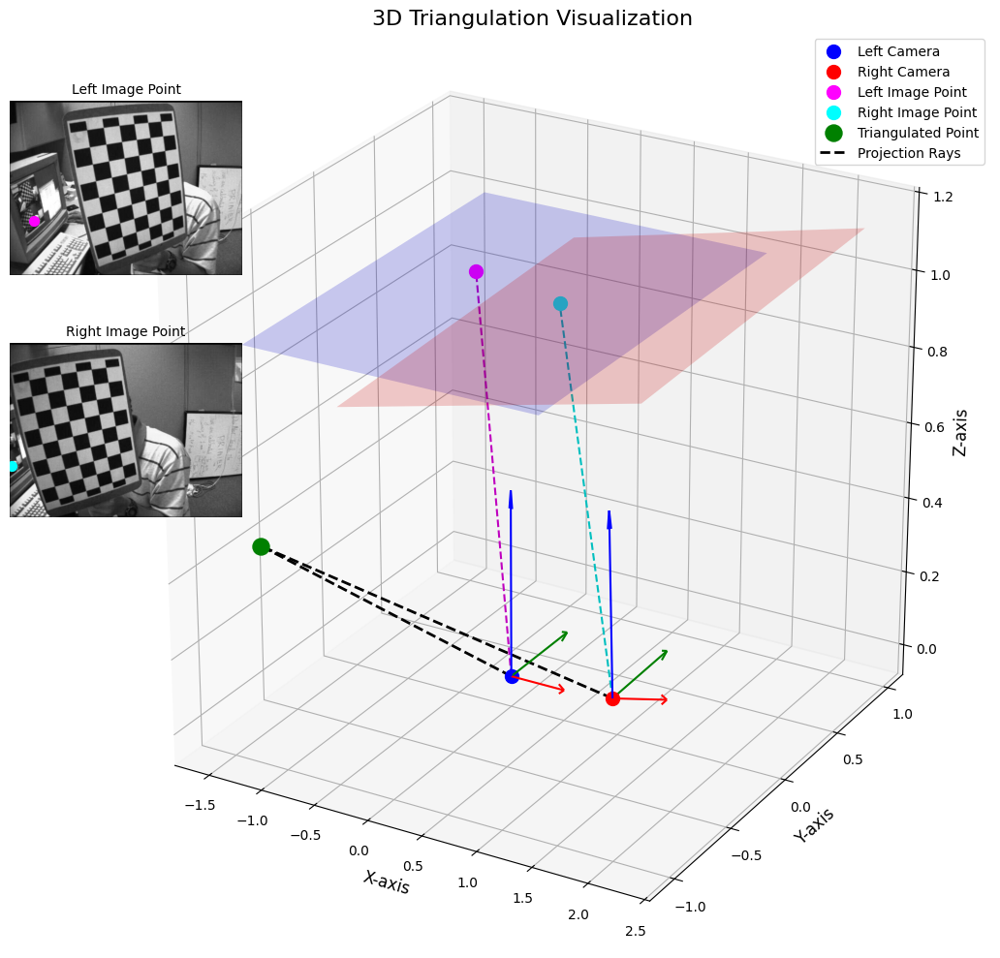

In [15]:
# Import the required 3D art utilities for the epipolar plane
from mpl_toolkits.mplot3d import art3d

# Visualize the triangulation process with the enhanced visualization
fig, ax = visualize_triangulation(
    P_left, P_right, point_left, point_right, X, img_left, img_right,
    K_left, K_right, R, t.squeeze()
)

# Ректификация

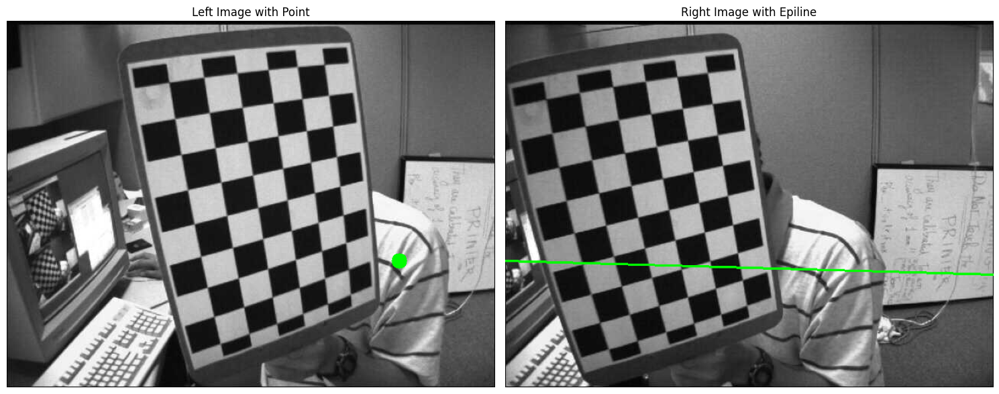

In [16]:
# Select a random point from the left image
random_index = 64
random_point_left = pts1[random_index]

# Compute the corresponding epiline in the right image
epiline_right = cv2.computeCorrespondEpilines(random_point_left.reshape(-1, 1, 2), 1, F)
epiline_right = epiline_right.reshape(-1, 3)[0]

# Draw the random point on the left image
img_left_with_point = cv2.cvtColor(img_left, cv2.COLOR_GRAY2BGR)
cv2.circle(img_left_with_point, tuple(random_point_left), 10, (0, 255, 0), -1)

# Draw the epiline on the right image
img_right_with_epiline = cv2.cvtColor(img_right, cv2.COLOR_GRAY2BGR)
r, c = img_right.shape
x0, y0 = map(int, [0, -epiline_right[2] / epiline_right[1]])
x1, y1 = map(int, [c, -(epiline_right[2] + epiline_right[0] * c) / epiline_right[1]])
cv2.line(img_right_with_epiline, (x0, y0), (x1, y1), (0, 255, 0), 2)

# Plot the images
plot_images([img_left_with_point, img_right_with_epiline], titles=['Left Image with Point', 'Right Image with Epiline'])

In [17]:
def rectify_images(img_left, img_right, K_left, K_right, dist_left, dist_right, R, t):
    """Rectify a pair of stereo images."""
    h, w = img_left.shape[:2]
    
    # Compute rectification parameters
    R1, R2, P1, P2, Q, roi1, roi2 = cv2.stereoRectify(
        K_left, dist_left, K_right, dist_right, (w, h), R, t.reshape(3, 1),
        flags=cv2.CALIB_ZERO_DISPARITY, alpha=1
    )
    
    # Compute undistortion and rectification maps
    map1x, map1y = cv2.initUndistortRectifyMap(K_left, dist_left, R1, P1, (w, h), cv2.CV_32FC1)
    map2x, map2y = cv2.initUndistortRectifyMap(K_right, dist_right, R2, P2, (w, h), cv2.CV_32FC1)
    
    # Rectify images
    rect_left = cv2.remap(img_left, map1x, map1y, cv2.INTER_LINEAR)
    rect_right = cv2.remap(img_right, map2x, map2y, cv2.INTER_LINEAR)
    
    return rect_left, rect_right, R1, R2, P1, P2, Q, roi1, roi2

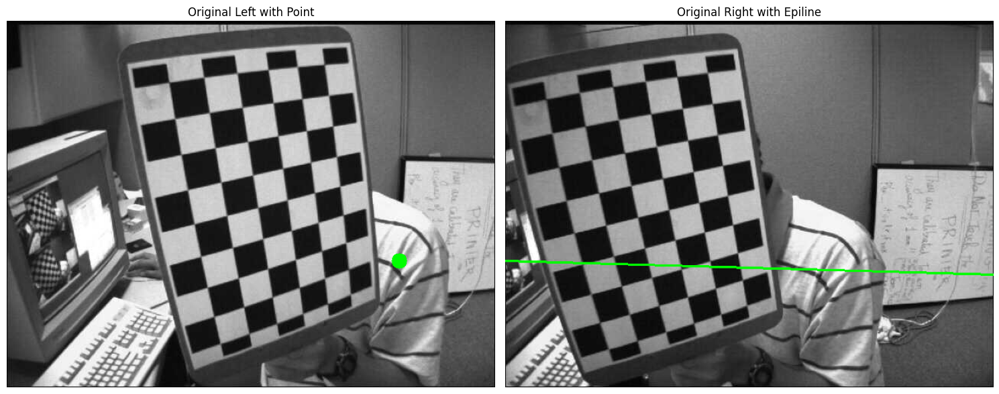

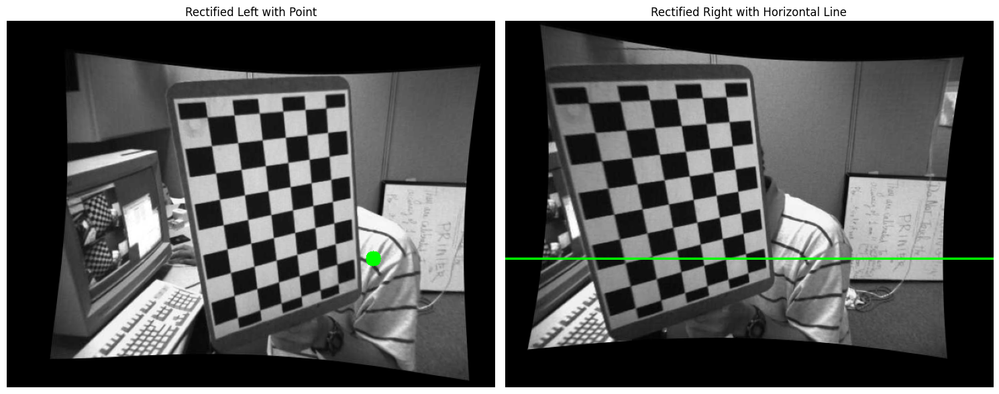

In [18]:
# Simplified point transformation function
def transform_point(point, K, dist, R_rect, P_rect):
    """Transform a point from original image to rectified image, simplified approach."""
    # Convert to normalized coordinates
    x, y = point
    x_norm = (x - K[0, 2]) / K[0, 0]
    y_norm = (y - K[1, 2]) / K[1, 1]
    
    # Create homogeneous point and apply rectification rotation
    pt_3d = R_rect @ np.array([x_norm, y_norm, 1.0])
    
    # Convert back to pixel coordinates using projection matrix
    x_rect = pt_3d[0] / pt_3d[2] * P_rect[0, 0] + P_rect[0, 2]
    y_rect = pt_3d[1] / pt_3d[2] * P_rect[1, 1] + P_rect[1, 2]
    
    return int(x_rect), int(y_rect)

# Rectify images and prepare visualization
rect_left, rect_right, R1, R2, P1, P2, Q, roi1, roi2 = rectify_images(
    img_left, img_right, 
    left_calibration_result['camera_matrix'],
    right_calibration_result['camera_matrix'],
    left_calibration_result['dist_coeffs'],
    right_calibration_result['dist_coeffs'],
    R, t
)

# Transform point from original to rectified image
random_point_rect = transform_point(
    random_point_left,
    left_calibration_result['camera_matrix'],
    left_calibration_result['dist_coeffs'],
    R1, P1
)

# Create visualization images
# Original images with point and epipolar line
img_left_with_point = cv2.cvtColor(img_left, cv2.COLOR_GRAY2BGR)
cv2.circle(img_left_with_point, tuple(random_point_left), 10, (0, 255, 0), -1)

img_right_with_epiline = cv2.cvtColor(img_right, cv2.COLOR_GRAY2BGR)
x0, y0 = map(int, [0, -epiline_right[2] / epiline_right[1]])
x1, y1 = map(int, [img_right.shape[1], -(epiline_right[2] + epiline_right[0] * img_right.shape[1]) / epiline_right[1]])
cv2.line(img_right_with_epiline, (x0, y0), (x1, y1), (0, 255, 0), 2)

# Rectified images with point and horizontal line
rect_left_with_point = cv2.cvtColor(rect_left, cv2.COLOR_GRAY2BGR) if len(rect_left.shape) == 2 else rect_left.copy()
cv2.circle(rect_left_with_point, random_point_rect, 10, (0, 255, 0), -1)

rect_right_with_line = cv2.cvtColor(rect_right, cv2.COLOR_GRAY2BGR) if len(rect_right.shape) == 2 else rect_right.copy()
cv2.line(rect_right_with_line, (0, random_point_rect[1]), (rect_right.shape[1], random_point_rect[1]), (0, 255, 0), 2)

# Display results
plot_images([img_left_with_point, img_right_with_epiline], 
            titles=['Original Left with Point', 'Original Right with Epiline'])
plot_images([rect_left_with_point, rect_right_with_line], 
            titles=['Rectified Left with Point', 'Rectified Right with Horizontal Line'])

## Визуализация эффекта гомографии в ректификации

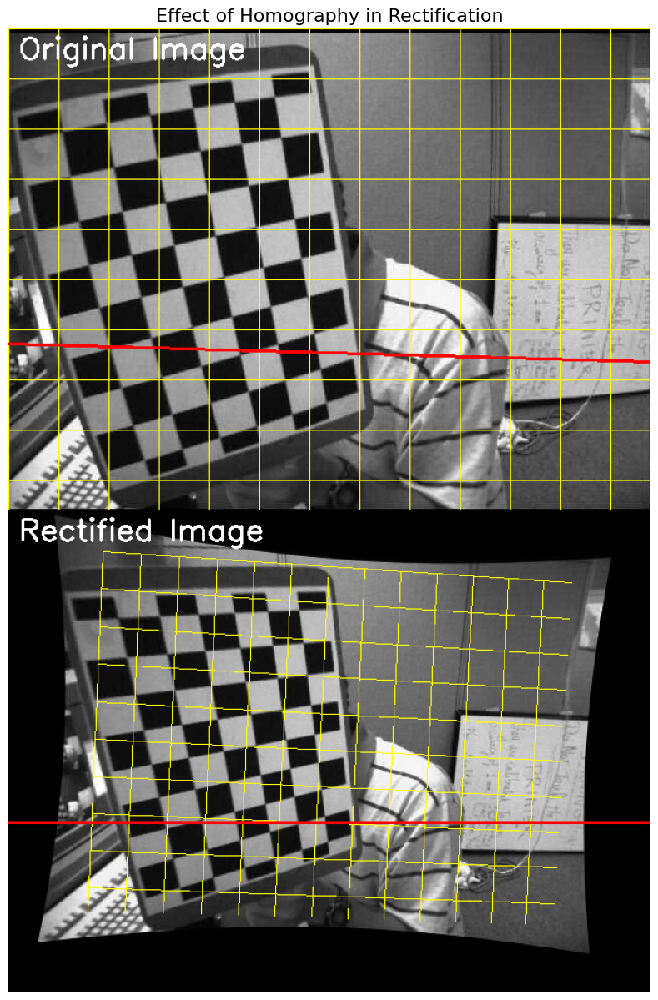

In [19]:
def draw_grid(img, grid_size=40, color=(0, 255, 0), thickness=1):
    """Draw a grid on an image.
    
    Args:
        img: Input image
        grid_size: Size of grid cells
        color: Color of grid lines
        thickness: Thickness of grid lines
        
    Returns:
        Image with grid
    """
    h, w = img.shape[:2]
    img_with_grid = img.copy()
    
    # Draw vertical lines
    for x in range(0, w, grid_size):
        cv2.line(img_with_grid, (x, 0), (x, h), color, thickness)
    
    # Draw horizontal lines
    for y in range(0, h, grid_size):
        cv2.line(img_with_grid, (0, y), (w, y), color, thickness)
    
    return img_with_grid

def transform_grid_with_homography(img, H, grid_size=40, color=(0, 255, 0), thickness=1):
    """Draw a transformed grid on an image using homography.
    
    Args:
        img: Input image
        H: Homography matrix
        grid_size: Size of grid cells
        color: Color of grid lines
        thickness: Thickness of grid lines
        
    Returns:
        Image with transformed grid
    """
    h, w = img.shape[:2]
    img_with_grid = img.copy()
    
    # Draw vertical lines after transformation
    for x in range(0, w, grid_size):
        pts = np.array([[x, 0], [x, h]], dtype=np.float32).reshape(-1, 1, 2)
        transformed_pts = cv2.perspectiveTransform(pts, H)
        
        pt1 = tuple(map(int, transformed_pts[0][0]))
        pt2 = tuple(map(int, transformed_pts[1][0]))
        cv2.line(img_with_grid, pt1, pt2, color, thickness)
    
    # Draw horizontal lines after transformation
    for y in range(0, h, grid_size):
        pts = np.array([[0, y], [w, y]], dtype=np.float32).reshape(-1, 1, 2)
        transformed_pts = cv2.perspectiveTransform(pts, H)
        
        pt1 = tuple(map(int, transformed_pts[0][0]))
        pt2 = tuple(map(int, transformed_pts[1][0]))
        cv2.line(img_with_grid, pt1, pt2, color, thickness)
    
    return img_with_grid

# Extract the homography matrices from rectification process
# These matrices are embedded in the rectification maps
h, w = img_right.shape[:2]

# Get homography matrices from rectification parameters
# H1 and H2 are rectification homographies for the left and right images
H1 = np.matmul(P1[:, :3], np.matmul(R1, np.linalg.inv(K_left)))
H2 = np.matmul(P2[:, :3], np.matmul(R2, np.linalg.inv(K_right)))

# Prepare images for visualization
# Original image with grid and epipolar line
img_right_with_grid = cv2.cvtColor(img_right, cv2.COLOR_GRAY2BGR)
img_right_with_grid = draw_grid(img_right_with_grid, grid_size=50, color=(0, 255, 255), thickness=1)

# Draw epipolar line on the original image
epiline_right = cv2.computeCorrespondEpilines(random_point_left.reshape(-1, 1, 2), 1, F)
epiline_right = epiline_right.reshape(-1, 3)[0]
x0, y0 = map(int, [0, -epiline_right[2] / epiline_right[1]])
x1, y1 = map(int, [img_right.shape[1], -(epiline_right[2] + epiline_right[0] * img_right.shape[1]) / epiline_right[1]])
cv2.line(img_right_with_grid, (x0, y0), (x1, y1), (0, 0, 255), 2)

# Rectified image with transformed grid and horizontal epipolar line
rect_right_with_grid = cv2.cvtColor(rect_right, cv2.COLOR_GRAY2BGR)
rect_right_with_grid = transform_grid_with_homography(rect_right_with_grid, H2, grid_size=50, color=(0, 255, 255), thickness=1)

# Draw horizontal epipolar line on rectified image
cv2.line(rect_right_with_grid, (0, random_point_rect[1]), (rect_right.shape[1], random_point_rect[1]), (0, 0, 255), 2)

# Create a combined visualization
combined_img = np.vstack([
    cv2.putText(img_right_with_grid.copy(), "Original Image", (10, 30), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2),
    cv2.putText(rect_right_with_grid.copy(), "Rectified Image", (10, 30), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
])

plt.figure(figsize=(15, 15))
plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Effect of Homography in Rectification', fontsize=16)
plt.show()

## Как ректифицировать изображения в OpenCV

### Калибровка с помощью cv2.stereoCalibrate()

In [20]:
def stereo_calibrate(left_image_paths, right_image_paths, chessboard_size=(7, 6), verbose=True):
    """
    Calibrate a stereo camera setup using chessboard images.
    
    Args:
        left_image_paths: List of Path objects pointing to left camera calibration images
        right_image_paths: List of Path objects pointing to right camera calibration images
        chessboard_size: Size of the chessboard pattern as (width, height)
        verbose: Whether to print calibration results
        
    Returns:
        dict: Dictionary containing calibration results with keys:
            - 'success': Boolean indicating if calibration was successful
            - 'K1': Camera matrix for the first (left) camera
            - 'K2': Camera matrix for the second (right) camera
            - 'd1': Distortion coefficients for the first camera
            - 'd2': Distortion coefficients for the second camera
            - 'R': Rotation matrix between the coordinate systems of the first and the second cameras
            - 't': Translation vector between coordinate systems of the cameras
            - 'E': Essential matrix
            - 'F': Fundamental matrix
            - 'error': RMS reprojection error
    """
    # Ensure the image paths are sorted correctly and correspond to each other
    left_image_paths = sorted(left_image_paths)
    right_image_paths = sorted(right_image_paths)
    
    # Ensure equal number of left and right images
    if len(left_image_paths) != len(right_image_paths):
        if verbose:
            print(f"Warning: Different number of left ({len(left_image_paths)}) and right ({len(right_image_paths)}) images")
        # Use the minimum number
        min_images = min(len(left_image_paths), len(right_image_paths))
        left_image_paths = left_image_paths[:min_images]
        right_image_paths = right_image_paths[:min_images]
    
    # Setup criteria for cornerSubPix
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    # Prepare object points (0,0,0), (1,0,0), (2,0,0) ..., (6,5,0)
    objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
    objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
    
    # Arrays to store object points and image points from all images
    objpoints = []  # 3D points in real world space
    imgpoints_left = []  # 2D points in left image plane
    imgpoints_right = []  # 2D points in right image plane
    
    # Image size
    image_size = None
    
    successful_pairs = 0
    
    # Process each pair of images
    for left_path, right_path in zip(left_image_paths, right_image_paths):
        # Read images
        img_left = cv2.imread(str(left_path), cv2.IMREAD_GRAYSCALE)
        img_right = cv2.imread(str(right_path), cv2.IMREAD_GRAYSCALE)
        
        if img_left is None or img_right is None:
            if verbose:
                print(f"Could not read images: {left_path}, {right_path}")
            continue
        
        # Store image size if not already done
        if image_size is None:
            image_size = img_left.shape[::-1]  # (width, height)
        
        # Find chessboard corners in both images
        ret_left, corners_left = cv2.findChessboardCorners(img_left, chessboard_size, None)
        ret_right, corners_right = cv2.findChessboardCorners(img_right, chessboard_size, None)
        
        # If corners found in both images, refine and store
        if ret_left and ret_right:
            successful_pairs += 1
            
            # Refine corners
            corners_left_refined = cv2.cornerSubPix(
                img_left, corners_left, (11, 11), (-1, -1), criteria
            )
            corners_right_refined = cv2.cornerSubPix(
                img_right, corners_right, (11, 11), (-1, -1), criteria
            )
            
            # Store points
            objpoints.append(objp)
            imgpoints_left.append(corners_left_refined)
            imgpoints_right.append(corners_right_refined)
            
            # Optional: Visualize detected corners
            if verbose and successful_pairs == 1:  # Just show the first pair
                img_left_corners = cv2.cvtColor(img_left, cv2.COLOR_GRAY2BGR)
                img_right_corners = cv2.cvtColor(img_right, cv2.COLOR_GRAY2BGR)
                
                cv2.drawChessboardCorners(img_left_corners, chessboard_size, corners_left_refined, ret_left)
                cv2.drawChessboardCorners(img_right_corners, chessboard_size, corners_right_refined, ret_right)
                
                plot_images([img_left_corners, img_right_corners], 
                            titles=['Left Camera Corners', 'Right Camera Corners'])
    
    # Prepare result dictionary with default values
    result = {
        'success': False,
        'K1': None,
        'K2': None,
        'd1': None,
        'd2': None,
        'R': None,
        't': None,
        'E': None,
        'F': None,
        'error': None,
        'image_size': image_size,
        'successful_pairs': successful_pairs
    }
    
    if verbose:
        print(f"Successfully processed {successful_pairs} image pairs out of {len(left_image_paths)}")
    
    if successful_pairs == 0:
        return result
    
    # Calibrate each camera separately first
    ret_left, K1, d1, rvecs_left, tvecs_left = cv2.calibrateCamera(
        objpoints, imgpoints_left, image_size, None, None
    )
    
    ret_right, K2, d2, rvecs_right, tvecs_right = cv2.calibrateCamera(
        objpoints, imgpoints_right, image_size, None, None
    )
    
    # Stereo calibration
    flags = 0
    # Uncomment below if you want to fix intrinsic parameters (if already well calibrated)
    # flags = cv2.CALIB_FIX_INTRINSIC
    
    stereocalib_criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)
    
    # Perform stereo calibration
    ret, K1, d1, K2, d2, R, t, E, F = cv2.stereoCalibrate(
        objpoints, imgpoints_left, imgpoints_right,
        K1, d1, K2, d2, image_size,
        criteria=stereocalib_criteria,
        flags=flags
    )
    
    # Update result dictionary
    result.update({
        'success': True,
        'K1': K1,
        'K2': K2,
        'd1': d1,
        'd2': d2,
        'R': R,
        't': t,
        'E': E,
        'F': F,
        'error': ret
    })
    
    if verbose:
        print("Stereo Calibration Results:")
        print(f"RMS Error: {ret}")
        print("\nLeft Camera Matrix (K1):")
        print(K1)
        print("\nLeft Distortion Coefficients (d1):")
        print(d1)
        print("\nRight Camera Matrix (K2):")
        print(K2)
        print("\nRight Distortion Coefficients (d2):")
        print(d2)
        print("\nRotation Matrix (R):")
        print(R)
        print("\nTranslation Vector (t):")
        print(t)
        print("\nEssential Matrix (E):")
        print(E)
        print("\nFundamental Matrix (F):")
        print(F)
    
    return result

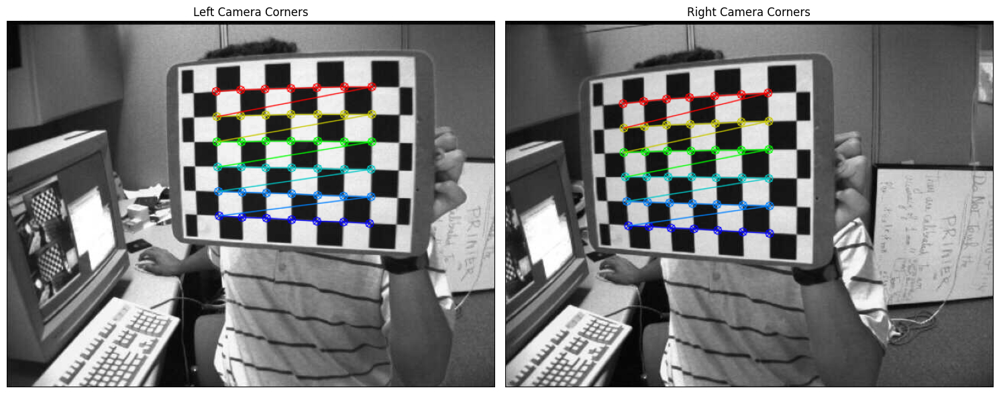

Successfully processed 4 image pairs out of 13
Stereo Calibration Results:
RMS Error: 0.15764373221006475

Left Camera Matrix (K1):
[[538.20313467   0.         335.11531145]
 [  0.         538.32171119 230.1517699 ]
 [  0.           0.           1.        ]]

Left Distortion Coefficients (d1):
[[-2.99308330e-01  1.66868173e-01  1.46445155e-03 -1.06638471e-04
  -9.84553539e-02]]

Right Camera Matrix (K2):
[[538.63755243   0.         323.50587621]
 [  0.         539.18556709 248.19298006]
 [  0.           0.           1.        ]]

Right Distortion Coefficients (d2):
[[-2.87300677e-01  8.11637182e-02 -2.86012062e-04  8.31761912e-04
   8.59238169e-02]]

Rotation Matrix (R):
[[ 0.99998993  0.00407043 -0.00188743]
 [-0.00409281  0.99991953 -0.01200751]
 [ 0.0018384   0.01201512  0.99992613]]

Translation Vector (t):
[[-3.33747353]
 [ 0.03123697]
 [-0.0493851 ]]

Essential Matrix (E):
[[-1.44697792e-04  4.97564440e-02  3.06416730e-02]
 [-4.32489905e-02  3.98991188e-02  3.33732019e+00]
 [-1.7

In [21]:
# Run stereo calibration on our dataset
stereo_calib_result = stereo_calibrate(
    left_image_paths,
    right_image_paths, 
    CHESSBOARD_SIZE
)

# Extract the calibration results for later use
if stereo_calib_result['success']:
    # Store variables with more common names for later use
    K1 = stereo_calib_result['K1']
    K2 = stereo_calib_result['K2']
    d1 = stereo_calib_result['d1']
    d2 = stereo_calib_result['d2']
    R = stereo_calib_result['R']
    t = stereo_calib_result['t']
    E = stereo_calib_result['E']
    F = stereo_calib_result['F']
    image_size = stereo_calib_result['image_size']
    
    # Compare the stereo F matrix with the F matrix computed earlier
    print("\nComparing fundamental matrices:")
    if 'F' in locals():
        F_stereo = F / np.linalg.norm(F)
        if 'F_from_E' in locals():
            F_prev = F_from_E / np.linalg.norm(F_from_E)
            diff = np.linalg.norm(F_stereo - F_prev)
            print(f"Difference between stereo F and previous F: {diff:.6f}")
else:
    print("Stereo calibration failed!")

### Ректификация с помощью cv2.stereoRectify()

In [22]:
img_left = cv2.imread(str(left_image_paths[-1]), cv2.IMREAD_GRAYSCALE)
img_right = cv2.imread(str(right_image_paths[-1]), cv2.IMREAD_GRAYSCALE)

In [23]:
R1, R2, P1, P2, Q, _, _ = cv2.stereoRectify(
    K1, d1, K2, d2, image_size, R, t,
    flags=cv2.CALIB_ZERO_DISPARITY, alpha=0.5,
)

In [24]:
map1x, map1y = cv2.initUndistortRectifyMap(
    K1, d1, R1, P1, image_size, cv2.CV_32FC1
)
map2x, map2y = cv2.initUndistortRectifyMap(
    K2, d2, R2, P2, image_size, cv2.CV_32FC1
)

In [25]:
rectified1 = cv2.remap(img_left, map1x, map1y, cv2.INTER_LINEAR)
rectified2 = cv2.remap(img_right, map2x, map2y, cv2.INTER_LINEAR)

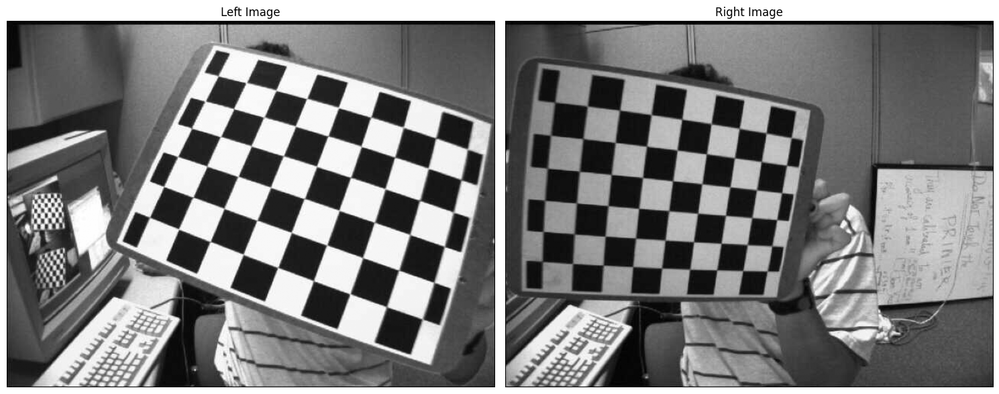

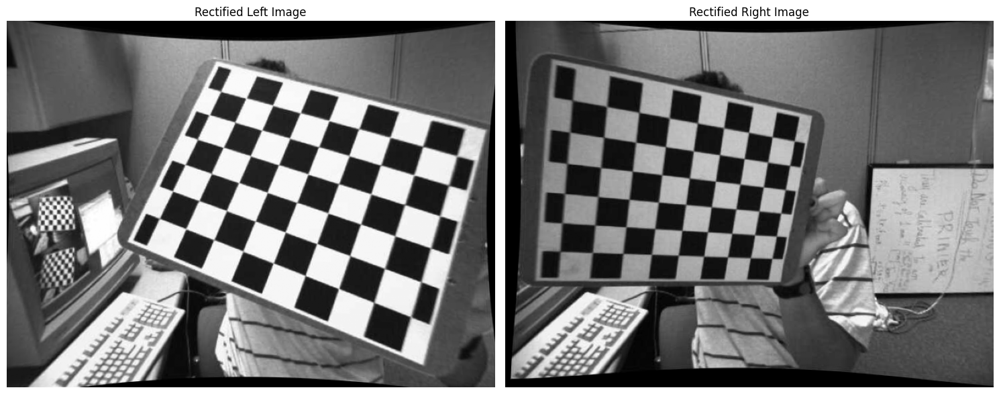

In [26]:
plot_images([img_left, img_right], titles=['Left Image', 'Right Image'], cmap='gray')
plot_images([rectified1, rectified2], titles=['Rectified Left Image', 'Rectified Right Image'], cmap='gray')

### Первый способ проверить результат ректификации

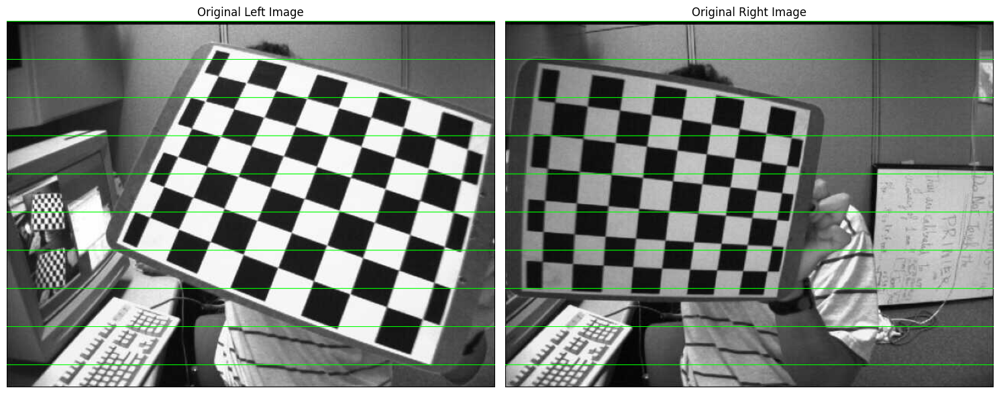

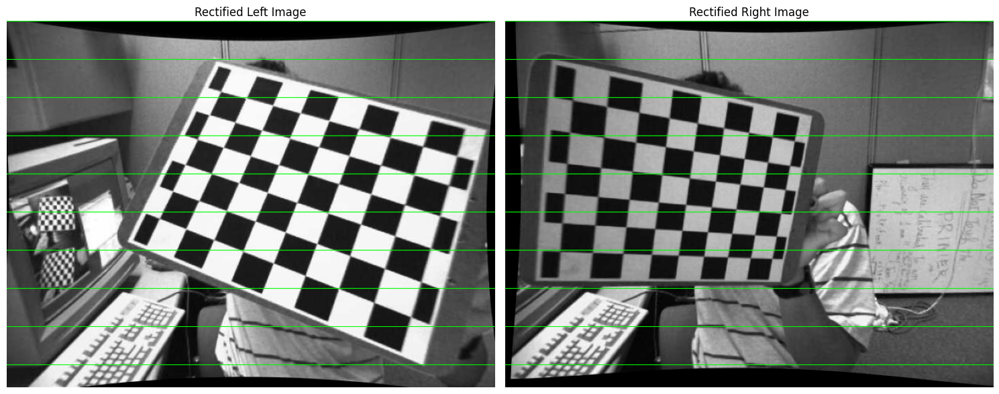

In [27]:
# Create a function to draw horizontal lines on images
def draw_horizontal_lines(img1, img2, line_spacing=50, color=(0, 255, 0), thickness=1):
    """
    Draw horizontal lines on images at regular intervals
    
    Args:
        img1: First image
        img2: Second image
        line_spacing: Spacing between lines in pixels
        color: Line color (BGR)
        thickness: Line thickness
        
    Returns:
        Tuple of images with horizontal lines
    """
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Convert to color if grayscale
    if len(img1.shape) == 2:
        img1_with_lines = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    else:
        img1_with_lines = img1.copy()
        
    if len(img2.shape) == 2:
        img2_with_lines = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    else:
        img2_with_lines = img2.copy()
    
    # Draw horizontal lines
    for y in range(0, h1, line_spacing):
        cv2.line(img1_with_lines, (0, y), (w1, y), color, thickness)
        
    for y in range(0, h2, line_spacing):
        cv2.line(img2_with_lines, (0, y), (w2, y), color, thickness)
    
    return img1_with_lines, img2_with_lines

# Draw lines on original and rectified images
original_left_with_lines, original_right_with_lines = draw_horizontal_lines(img_left, img_right)
rectified_left_with_lines, rectified_right_with_lines = draw_horizontal_lines(rectified1, rectified2)

# Display the results
plot_images([original_left_with_lines, original_right_with_lines], 
            titles=['Original Left Image', 'Original Right Image'])
plot_images([rectified_left_with_lines, rectified_right_with_lines], 
            titles=['Rectified Left Image', 'Rectified Right Image'])

### Второй способ проверить результат ректификации

In [28]:
def visualize_stereo_correspondences(img_left, img_right, num_matches=10):
    """
    Detect keypoints using SIFT, find correspondences, and visualize them.
    
    Args:
        img_left: Left stereo image
        img_right: Right stereo image
        num_matches: Number of best matches to display
        
    Returns:
        Image showing both stereo images with keypoints and correspondence lines
    """
    # Convert images to grayscale if they're color
    if len(img_left.shape) == 3:
        gray_left = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
    else:
        gray_left = img_left
        img_left = cv2.cvtColor(img_left, cv2.COLOR_GRAY2BGR)
        
    if len(img_right.shape) == 3:
        gray_right = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
    else:
        gray_right = img_right
        img_right = cv2.cvtColor(img_right, cv2.COLOR_GRAY2BGR)
    
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Find keypoints and descriptors
    kp_left, des_left = sift.detectAndCompute(gray_left, None)
    kp_right, des_right = sift.detectAndCompute(gray_right, None)
    
    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    
    # FLANN matcher
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_left, des_right, k=2)
    
    # Apply ratio test to find good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    
    # Sort matches by distance (smaller is better)
    good_matches = sorted(good_matches, key=lambda x: x.distance)
    
    # Take the top matches
    top_matches = good_matches[:num_matches]
    
    # Create result image
    h1, w1 = img_left.shape[:2]
    h2, w2 = img_right.shape[:2]
    height = max(h1, h2)
    width = w1 + w2
    result = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Place images side by side
    result[:h1, :w1] = img_left
    result[:h2, w1:w1+w2] = img_right
    
    # Draw keypoints and lines
    colors = [(np.random.randint(0, 255), np.random.randint(0, 255), np.random.randint(0, 255)) for _ in range(num_matches)]
    
    for i, match in enumerate(top_matches):
        # Get the keypoints from the good matches
        left_idx = match.queryIdx
        right_idx = match.trainIdx
        
        # Get the coordinates
        (x1, y1) = kp_left[left_idx].pt
        (x2, y2) = kp_right[right_idx].pt
        
        # Adjust right image coordinates
        x2 = x2 + w1
        
        # Draw circles for keypoints
        cv2.circle(result, (int(x1), int(y1)), 8, colors[i], 3)
        cv2.circle(result, (int(x2), int(y2)), 8, colors[i], 3)
        
        # Draw lines between matching keypoints
        cv2.line(result, (int(x1), int(y1)), (int(x2), int(y2)), colors[i], 2)

    return result

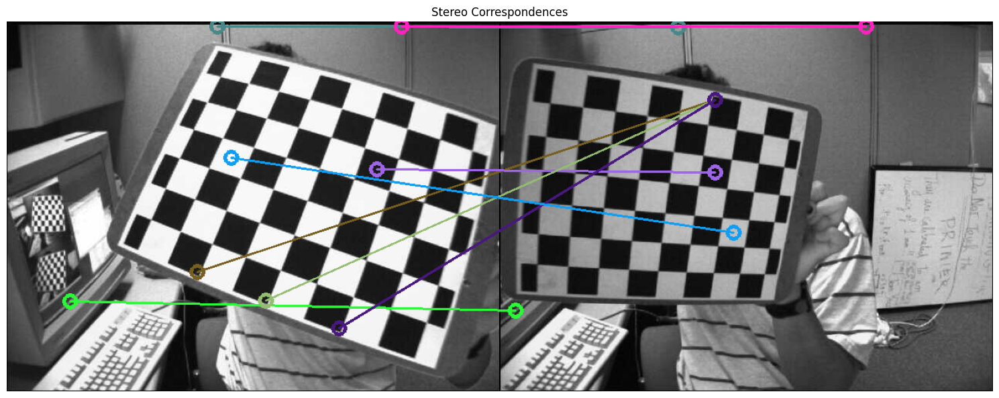

In [29]:
sift_stereo_result = visualize_stereo_correspondences(
    img_left, img_right, num_matches=10
)

plot_images([sift_stereo_result], titles=['Stereo Correspondences'])

# Построение карты глубины: классические методы

In [30]:
def sad(patch1: np.ndarray, patch2: np.ndarray) -> float:
    """
    Calculate the Sum of Absolute Differences (SAD) between two image patches.
    
    Args:
        patch1: First image patch as a numpy array
        patch2: Second image patch as a numpy array of the same size
        
    Returns:
        SAD value (lower values indicate greater similarity)
    """
    return np.sum(np.abs(patch1 - patch2))


def ssd(patch1: np.ndarray, patch2: np.ndarray) -> float:
    """
    Calculate the Sum of Squared Differences (SSD) between two image patches.
    
    Args:
        patch1: First image patch as a numpy array
        patch2: Second image patch as a numpy array of the same size
        
    Returns:
        SSD value (lower values indicate greater similarity)
    """
    return np.sum((patch1 - patch2) ** 2)


def ncc(patch1: np.ndarray, patch2: np.ndarray) -> float:
    """
    Calculate the Normalized Cross-Correlation (NCC) between two image patches.
    
    Args:
        patch1: First image patch as a numpy array
        patch2: Second image patch as a numpy array of the same size
        
    Returns:
        NCC value (higher values indicate greater similarity, range [-1, 1])
    """
    patch1_normalized = patch1 - np.mean(patch1)
    patch2_normalized = patch2 - np.mean(patch2)
    
    numerator = np.sum(patch1_normalized * patch2_normalized)
    denominator = np.sqrt(np.sum(patch1_normalized ** 2) * np.sum(patch2_normalized ** 2))
    
    # Handle division by zero
    if denominator == 0:
        return 0
    
    return numerator / denominator

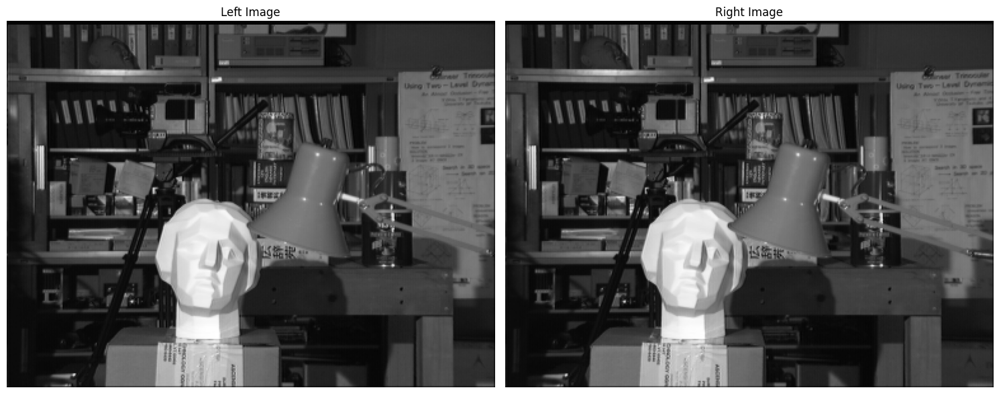

In [32]:
img_tsukuba_l = cv2.imread("./data/tsukuba_l.png", cv2.IMREAD_GRAYSCALE)
img_tsukuba_r = cv2.imread("./data/tsukuba_r.png", cv2.IMREAD_GRAYSCALE)

plot_images([img_tsukuba_l, img_tsukuba_r], titles=['Left Image', 'Right Image'], cmap='gray')

In [55]:
def visualize_disparity_search(img_left, img_right, point, max_disparity, metric_fn, window_size=7, fps=5, output_path='disparity_search.gif'):
    """
    Visualize the disparity search process with a moving window and synchronized metric graph.
    
    Args:
        img_left: Left stereo image
        img_right: Right stereo image
        point: Tuple (x, y) representing the point on the left image
        max_disparity: Maximum disparity value to search
        metric_fn: Function to calculate the similarity metric between two windows
                  (e.g., sad, ssd, or ncc functions)
        window_size: Size of the window (default: 7)
        fps: Frames per second for the animation (default: 5)
        output_path: Path to save the output GIF (default: 'disparity_search.gif')
        
    Returns:
        Path to the saved GIF file
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import imageio
    from io import BytesIO
    from PIL import Image
    
    # Convert images to grayscale if they're in color
    if len(img_left.shape) == 3:
        img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
        img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
    else:
        img_left_gray = img_left.copy()
        img_right_gray = img_right.copy()
    
    # Extract coordinates
    x, y = point
    half_win = window_size // 2
    
    # Initialize metric values array
    metric_values = []
    
    # Calculate theoretical maximum metric values
    win_area = window_size * window_size
    if metric_fn.__name__ == 'sad':
        # Max SAD = 255 * window_area (max difference * number of pixels)
        max_possible_value = 255 * win_area
        print(f"Max SAD value: {max_possible_value}")
    elif metric_fn.__name__ == 'ssd':
        # Max SSD = 255² * window_area (max squared difference * number of pixels)
        max_possible_value = 255 * 255 * win_area
    else:  # ncc
        # NCC ranges from -1 to 1
        max_possible_value = 1.0
    
    # Create figure and axes for visualization
    fig, (ax_images, ax_graph) = plt.subplots(2, 1, figsize=(10, 8))
    
    # Prepare frames for the animation
    frames = []
    
    # Process each possible disparity
    for d in range(max_disparity + 1):
        # Extract windows ensuring they're within image boundaries
        win_left_y_min = max(0, y - half_win)
        win_left_y_max = min(img_left_gray.shape[0], y + half_win + 1)
        win_left_x_min = max(0, x - half_win)
        win_left_x_max = min(img_left_gray.shape[1], x + half_win + 1)
        
        # Apply disparity to right image x-coordinate
        win_right_x = max(0, x - d)
        win_right_y_min = win_left_y_min  # Same y-coordinates in rectified stereo
        win_right_y_max = win_left_y_max
        win_right_x_min = max(0, win_right_x - half_win)
        win_right_x_max = min(img_right_gray.shape[1], win_right_x + half_win + 1)
        
        # Extract windows from images
        win_left = img_left_gray[win_left_y_min:win_left_y_max, win_left_x_min:win_left_x_max]
        win_right = img_right_gray[win_right_y_min:win_right_y_max, win_right_x_min:win_right_x_max]
        
        # Calculate metric value (handle case where windows might have different shapes)
        if win_left.shape == win_right.shape and win_left.size > 0 and win_right.size > 0:
            metric_value = metric_fn(win_left, win_right)
        else:
            # Default values for when window shapes don't match
            if metric_fn.__name__ == 'ncc':
                metric_value = -1  # Worst value for NCC
            else:
                metric_value = float('inf')  # Worst value for SAD/SSD
        
        metric_values.append(metric_value)
        
        # Create visualization
        ax_images.clear()
        ax_graph.clear()
        
        # Create side-by-side image display
        combined_img = np.hstack((img_left_gray, img_right_gray))
        ax_images.imshow(combined_img, cmap='gray')
        
        # Draw window on left image
        left_rect = plt.Rectangle((win_left_x_min, win_left_y_min), 
                                 win_left_x_max - win_left_x_min, 
                                 win_left_y_max - win_left_y_min,
                                 edgecolor='green', linewidth=2, facecolor='none')
        ax_images.add_patch(left_rect)
        
        # Draw window on right image (offset by left image width)
        left_width = img_left_gray.shape[1]
        right_rect = plt.Rectangle((left_width + win_right_x_min, win_right_y_min), 
                                  win_right_x_max - win_right_x_min, 
                                  win_right_y_max - win_right_y_min,
                                  edgecolor='red', linewidth=2, facecolor='none')
        ax_images.add_patch(right_rect)
        
        # Draw vertical lines to show the center points
        ax_images.axvline(x=x, color='green', linestyle='--', alpha=0.7)
        ax_images.axvline(x=left_width + win_right_x, color='red', linestyle='--', alpha=0.7)
        
        # Add labels to the images
        ax_images.text(img_left_gray.shape[1]//4, 20, "Left Image", 
                      color='white', fontsize=12, ha='center', 
                      bbox=dict(facecolor='green', alpha=0.5))
        ax_images.text(left_width + img_right_gray.shape[1]//4, 20, "Right Image", 
                      color='white', fontsize=12, ha='center', 
                      bbox=dict(facecolor='red', alpha=0.5))
        
        # Set image title and remove ticks for cleaner look
        ax_images.set_title(f'Disparity Search Animation (d = {d}, window size = {window_size})')
        ax_images.set_xticks([])
        ax_images.set_yticks([])
        
        # Plot metric values graph
        ax_graph.plot(range(len(metric_values)), metric_values, 'b-')
        ax_graph.scatter(d, metric_value, color='red', s=100)
        ax_graph.set_xlim(0, max_disparity)
        
        # Configure graph based on metric type
        if metric_fn.__name__ == 'ncc':
            # For NCC, higher is better
            y_min = min(min(metric_values) - 0.1, -0.2)
            ax_graph.set_ylim(y_min, 1.01 * max_possible_value)  # Slightly above theoretical max
            ax_graph.set_ylabel('NCC Value (higher is better)')
            # Mark the best value so far
            best_d = metric_values.index(max(metric_values))
            best_value = max(metric_values)
            ax_graph.axvline(x=best_d, color='green', linestyle=':', alpha=0.7)
            ax_graph.text(best_d, best_value, f'Best: {best_value:.3f} @ d={best_d}', 
                         color='green', fontsize=10, va='bottom', ha='right')
        else:
            # For SAD/SSD, lower is better
            valid_values = [v for v in metric_values if v != float('inf')]

            # use a default range
            ax_graph.set_ylim(0, max_possible_value * 1.1)
                
            ax_graph.set_ylabel(f'{metric_fn.__name__.upper()} Value (lower is better)')
            # Mark the best value so far
            if valid_values:  # Only if we have valid values
                best_d = metric_values.index(min(valid_values))
                best_value = min(valid_values)
                ax_graph.axvline(x=best_d, color='green', linestyle=':', alpha=0.7)
                ax_graph.text(best_d, best_value, f'Best: {best_value:.1f} @ d={best_d}', 
                             color='green', fontsize=10, va='top', ha='left')
        
        # Configure graph appearance
        ax_graph.set_xlabel('Disparity')
        ax_graph.grid(True, alpha=0.3)
        ax_graph.set_title(f'Metric Value ({metric_fn.__name__}) vs Disparity (Window: {window_size}×{window_size})')
        
        # Adjust layout
        plt.tight_layout()
        
        # Save the current figure as a frame using a more compatible method
        fig.canvas.draw()
        # Fix: Use BytesIO and PIL instead of tostring_rgb which is deprecated
        buf = BytesIO()
        fig.savefig(buf, format='png', dpi=100)
        buf.seek(0)
        img = np.array(Image.open(buf))
        frames.append(img)
    
    for _ in range(fps * 3):  # Add a 3 second static frame at the end
        frames.append(frames[-1])

    # Save animation as GIF
    imageio.mimsave(output_path, frames, fps=fps, loop=0)
    
    plt.close(fig)
    
    print(f"Animation saved to {output_path}")
    return output_path

In [56]:
# Example usage of the disparity search visualization
# Select a point in the left image
point = (250, 150)  # (x, y) coordinates
max_disp = 60  # Maximum disparity to search

# Create visualizations with different metrics
# SAD (Sum of Absolute Differences) - lower is better
visualize_disparity_search(img_tsukuba_l, img_tsukuba_r, point, max_disp, sad, 
                          window_size=9, output_path='./disparity_search_sad.gif')


Max SAD value: 20655
Animation saved to ./disparity_search_sad.gif


'./disparity_search_sad.gif'

## Bad vs good disparity

In [57]:
def add_stereo_noise(img_left, img_right, noise_types=None, params=None):
    """
    Add artificial noise to stereo image pair to degrade disparity map quality.
    
    Args:
        img_left: Left stereo image
        img_right: Right stereo image
        noise_types: List of noise types to apply, options include:
                   ['gaussian', 'blur', 'brightness', 'artifacts', 
                    'geometric', 'salt_pepper', 'motion_blur']
        params: Dictionary of parameters for each noise type
        
    Returns:
        Tuple of noisy left and right images
    """
    if noise_types is None:
        noise_types = ['gaussian']
    
    if params is None:
        params = {}
    
    # Create copies to avoid modifying original images
    noisy_left = img_left.copy()
    noisy_right = img_right.copy()
    
    # Convert to float32 for processing if they're not already
    if noisy_left.dtype != np.float32:
        noisy_left = noisy_left.astype(np.float32) / 255.0
    if noisy_right.dtype != np.float32:
        noisy_right = noisy_right.astype(np.float32) / 255.0
    
    for noise_type in noise_types:
        if noise_type == 'gaussian':
            # Default parameters
            mean = params.get('gaussian_mean', 0)
            var_left = params.get('gaussian_var_left', 0.01)
            var_right = params.get('gaussian_var_right', 0.01)
            
            # Add different gaussian noise to each image
            noise_left = np.random.normal(mean, np.sqrt(var_left), noisy_left.shape)
            noise_right = np.random.normal(mean, np.sqrt(var_right), noisy_right.shape)
            
            noisy_left = np.clip(noisy_left + noise_left, 0, 1)
            noisy_right = np.clip(noisy_right + noise_right, 0, 1)
            
        elif noise_type == 'blur':
            # Default parameters
            kernel_size_left = params.get('blur_kernel_left', 5)
            kernel_size_right = params.get('blur_kernel_right', 3)
            
            # Add asymmetric blur
            if kernel_size_left > 0:
                # Ensure kernel size is odd
                kernel_size_left = kernel_size_left if kernel_size_left % 2 == 1 else kernel_size_left + 1
                noisy_left = cv2.GaussianBlur(noisy_left, (kernel_size_left, kernel_size_left), 0)
            if kernel_size_right > 0:
                # Ensure kernel size is odd
                kernel_size_right = kernel_size_right if kernel_size_right % 2 == 1 else kernel_size_right + 1
                noisy_right = cv2.GaussianBlur(noisy_right, (kernel_size_right, kernel_size_right), 0)
                
        elif noise_type == 'brightness':
            # Default parameters
            brightness_left = params.get('brightness_left', 1.2)
            brightness_right = params.get('brightness_right', 0.8)
            contrast_left = params.get('contrast_left', 1.0)
            contrast_right = params.get('contrast_right', 1.0)
            
            # Apply brightness and contrast changes
            noisy_left = np.clip(noisy_left * contrast_left + brightness_left - 1, 0, 1)
            noisy_right = np.clip(noisy_right * contrast_right + brightness_right - 1, 0, 1)
            
        elif noise_type == 'artifacts':
            # Default parameters
            num_artifacts = params.get('num_artifacts', 30)
            max_size = params.get('artifact_max_size', 20)
            
            # Add random artifacts to right image only
            for _ in range(num_artifacts):
                x = np.random.randint(0, noisy_right.shape[1])
                y = np.random.randint(0, noisy_right.shape[0])
                size = np.random.randint(5, max_size)
                color = np.random.random()
                
                cv2.circle(noisy_right, (x, y), size, color, -1)
        
        elif noise_type == 'salt_pepper':
            # Default parameters
            ratio = params.get('salt_pepper_ratio', 0.01)
            
            # Add salt and pepper noise to right image
            s_vs_p = 0.5
            amount = ratio
            out = noisy_right.copy()
            
            # Salt
            num_salt = np.ceil(amount * noisy_right.size * s_vs_p)
            coords = [np.random.randint(0, i - 1, int(num_salt)) for i in noisy_right.shape]
            out[tuple(coords)] = 1
            
            # Pepper
            num_pepper = np.ceil(amount * noisy_right.size * (1. - s_vs_p))
            coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in noisy_right.shape]
            out[tuple(coords)] = 0
            
            noisy_right = out
            
        elif noise_type == 'motion_blur':
            # Default parameters
            kernel_size = params.get('motion_kernel_size', 15)
            angle = params.get('motion_angle', 45)
            
            # Create motion blur kernel
            # Ensure kernel size is odd
            kernel_size = kernel_size if kernel_size % 2 == 1 else kernel_size + 1
            M = cv2.getRotationMatrix2D((kernel_size // 2, kernel_size // 2), angle, 1)
            motion_kernel = np.zeros((kernel_size, kernel_size))
            motion_kernel[kernel_size // 2, :] = 1
            motion_kernel = cv2.warpAffine(motion_kernel, M, (kernel_size, kernel_size))
            motion_kernel = motion_kernel / np.sum(motion_kernel)
            
            # Apply motion blur to right image
            noisy_right = cv2.filter2D(noisy_right, -1, motion_kernel)
    
    # Convert back to original data type
    if img_left.dtype != np.float32:
        noisy_left = (noisy_left * 255).astype(img_left.dtype)
    if img_right.dtype != np.float32:
        noisy_right = (noisy_right * 255).astype(img_right.dtype)
    
    return noisy_left, noisy_right

In [58]:
def visualize_stereo_noise_effect(img_left, img_right, noise_types=None, params=None, stereo_method=None):
    """
    Visualize the effect of noise on disparity map quality.
    
    Args:
        img_left: Left stereo image
        img_right: Right stereo image
        noise_types: List of noise types to apply
        params: Parameters for noise types
        stereo_method: Stereo matching method (StereoBM or StereoSGBM instance)
        
    Returns:
        Tuple of (noisy_left, noisy_right, disparity_orig, disparity_noisy)
    """
    # Default stereo method
    if stereo_method is None:
        stereo_method = cv2.StereoSGBM_create(
            minDisparity=0,
            numDisparities=64,
            blockSize=5,
            P1=8 * 3 * 5**2,
            P2=32 * 3 * 5**2,
            disp12MaxDiff=1,
            uniquenessRatio=10,
            speckleWindowSize=100,
            speckleRange=2
        )
    
    # Generate noisy images
    noisy_left, noisy_right = add_stereo_noise(img_left, img_right, noise_types, params)
    
    # Compute disparity maps
    disparity_orig = stereo_method.compute(img_left, img_right)
    disparity_noisy = stereo_method.compute(noisy_left, noisy_right)
    
    # Normalize disparity maps for visualization
    disp_orig_vis = cv2.normalize(disparity_orig, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    disp_noisy_vis = cv2.normalize(disparity_noisy, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    # Create visualization layout
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 3, 1)
    plt.title('Original Left Image')
    plt.imshow(img_left, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 3, 2)
    plt.title('Original Right Image')
    plt.imshow(img_right, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 3, 3)
    plt.title('Original Disparity Map')
    plt.imshow(disp_orig_vis, cmap='jet')
    plt.axis('off')
    
    plt.subplot(2, 3, 4)
    plt.title('Noisy Left Image')
    plt.imshow(noisy_left, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 3, 5)
    plt.title('Noisy Right Image')
    plt.imshow(noisy_right, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 3, 6)
    plt.title('Noisy Disparity Map')
    plt.imshow(disp_noisy_vis, cmap='jet')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return noisy_left, noisy_right, disparity_orig, disparity_noisy

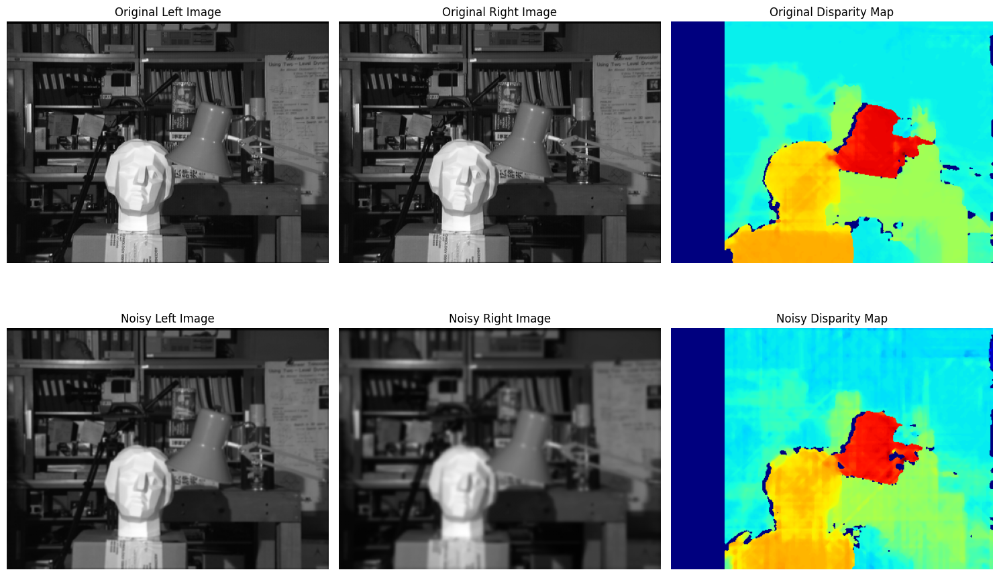

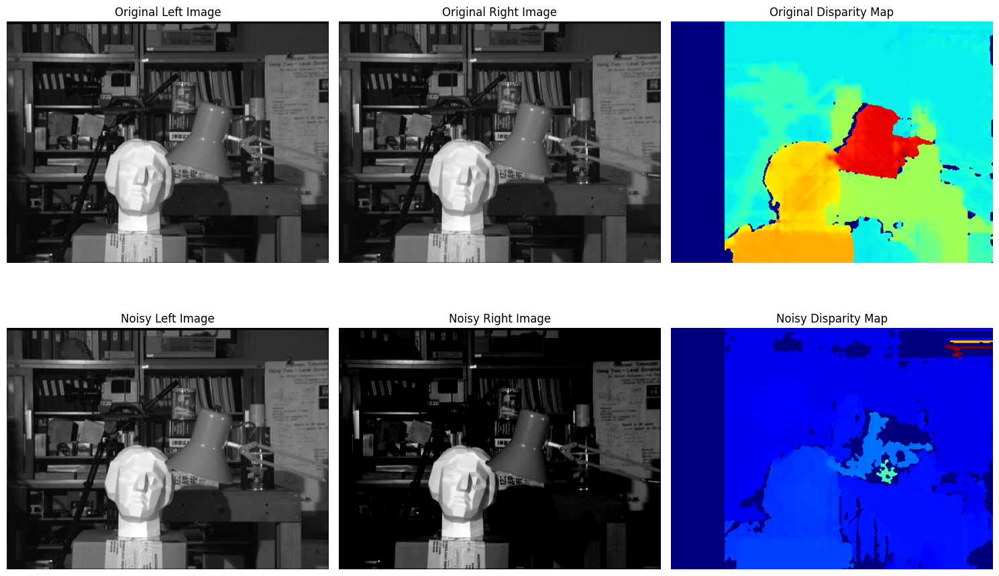

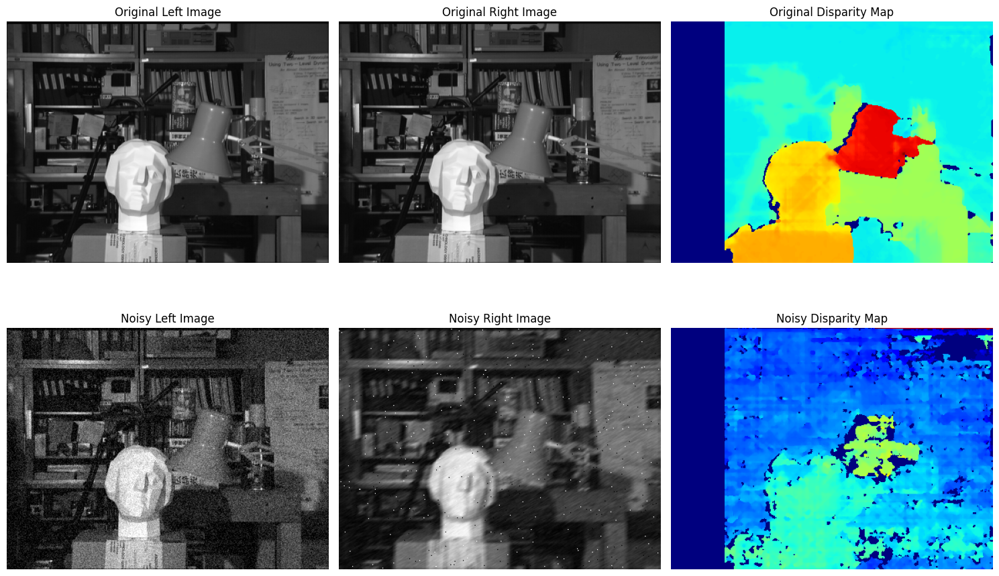

In [59]:
# Пример использования с разными типами шума

# 1. Пример с асимметричным размытием (одно изображение более размытое, чем другое)
noisy_left1, noisy_right1, disp_orig1, disp_noisy1 = visualize_stereo_noise_effect(
    img_tsukuba_l, img_tsukuba_r, 
    noise_types=['blur'],
    params={
        'blur_kernel_left': 3,  # легкое размытие
        'blur_kernel_right': 9  # сильное размытие
    }
)

# 2. Пример с асимметричной яркостью и контрастом
noisy_left2, noisy_right2, disp_orig2, disp_noisy2 = visualize_stereo_noise_effect(
    img_tsukuba_l, img_tsukuba_r, 
    noise_types=['brightness'],
    params={
        'brightness_left': 1.0,   # нормальная яркость
        'brightness_right': 0.7,  # более темное изображение
        'contrast_left': 1.0,     # нормальный контраст
        'contrast_right': 1.3     # увеличенный контраст
    }
)

# 3. Пример с комбинацией шумов
noisy_left3, noisy_right3, disp_orig3, disp_noisy3 = visualize_stereo_noise_effect(
    img_tsukuba_l, img_tsukuba_r, 
    noise_types=['gaussian', 'motion_blur', 'salt_pepper'],
    params={
        'gaussian_var_left': 0.005,
        'gaussian_var_right': 0.005,
        'motion_kernel_size': 7,
        'motion_angle': 30,
        'salt_pepper_ratio': 0.005
    }
)

In [ ]:
stereo = cv2.StereoBM_create(numDisparities=64, blockSize=15)

disparity = stereo.compute(img_tsukuba_l, img_tsukuba_r)

disp_vis = cv2.normalize(disparity, None, 0, 255, cv2.NORM_MINMAX)
disp_vis = disp_vis.astype('uint8')

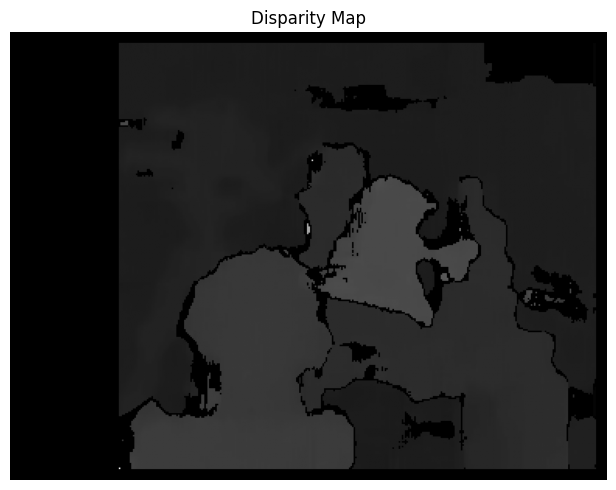

In [46]:
plot_images([disp_vis], titles=['Disparity Map'], cmap='gray', figsize=(10, 5))

## Semi-Global Matching (SGM)

In [51]:
stereo = cv2.StereoSGBM_create(
    minDisparity=0,        # Минимальное значение диспаратности.
                           # Обычно 0, но может быть отрицательным,
                           # если изображения смещены алгоритмом ректификации
    numDisparities=64,     # Максимальная минус минимальная диспаратность
                           # (количество возможных значений диспаратности).
                           # Должно быть кратно 16.
    blockSize=5,           # Размер блока для сопоставления.
                           # Должен быть нечетным (≥1). Обычно 3-11.
                           # Большие значения дают более гладкую карту, но меньше деталей.
    P1=8 * 1 * 5**2,       # Штраф за изменение диспаратности на 1 между соседними пикселями
    P2=32 * 1 * 5**2,      # Штраф за изменение диспаратности более чем на 1 (P2 > P1)
    disp12MaxDiff=1,       # Максимально допустимая разница при проверке левого-правого соответствия.
                           # Отрицательное значение отключает проверку.
    uniquenessRatio=10,    # Процент, на который лучшее совпадение должно превосходить второе лучшее.
    speckleWindowSize=100, # Параметры фильтрации шумовых пятен (speckles).
    speckleRange=2
)

disparity = stereo.compute(img_tsukuba_l, img_tsukuba_r)

disp_vis = cv2.normalize(disparity, None, 0, 255, cv2.NORM_MINMAX)
disp_vis = disp_vis.astype("uint8")

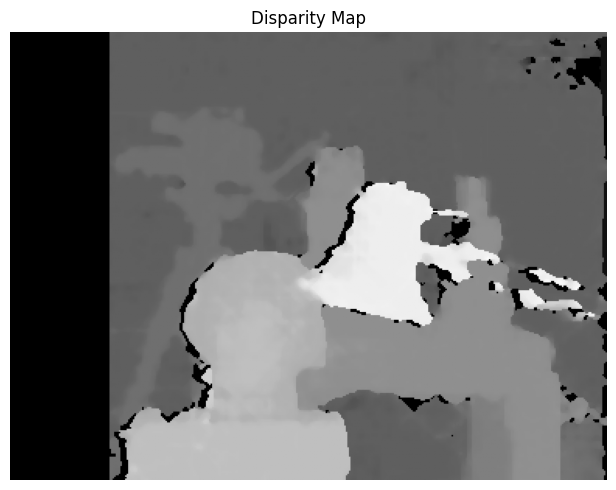

In [52]:
plot_images([disp_vis], titles=['Disparity Map'], cmap='gray', figsize=(10, 5))

## Bad vs good disparity